In [50]:
import sys
sys.path.append("../")

In [51]:
import pandas as pd
import plotly.graph_objects as go
from plotting import CandlePlot
import numpy as np

from simulation.pair_trade_percent_binance import PairTradePercent
from technicals.indicators import Donchian_Close

from functools import reduce


from sklearn.preprocessing import StandardScaler

In [52]:

from multiprocessing import Process, Manager
import pickle
import warnings
warnings.filterwarnings('ignore')

In [77]:
import pyvinecopulib as pv


In [113]:

def synchronize_dataframes(dfs, df_target, target_name='Target'):
    """
    Sincroniza múltiplos DataFrames pelo timestamp e calcula o índice baseado em regressão multivariada.
    :param dfs: Lista de DataFrames contendo os preços de fechamento dos ativos.
    :param df_target: DataFrame do ativo alvo.
    :param target_name: Nome do ativo alvo (usado no resultado final).
    :return: DataFrame sincronizado com o índice de regressão e o spread.
    """
    # Mesclar todos os DataFrames pelo Timestamp
    df = df_target[['Time', 'Close', 'High', 'Low']].rename(columns={'Close': target_name})
    for i, df_pair in enumerate(dfs):
        df = pd.merge(df, df_pair[['Time', 'Close']].rename(columns={'Close': f'Asset_{i}'}), 
                      on='Time', how='inner')
    return df


def transform_to_uniform(data):
    """
    Transforma os dados em distribuições uniformes [0, 1].
    """
    ecdf = (data.rank() - 1) / (len(data) - 1)  # Empirical CDF
    return ecdf.values

def apply_copula_with_family(df, target_name, copula_family='gaussian'):
    """
    Aplica uma cópula para modelar a dependência entre o ativo alvo e o cluster.
    :param df: DataFrame contendo os preços do ativo alvo e do cluster.
    :param target_name: Nome do ativo alvo.
    :param copula_family: Família da cópula ('gaussian', 'student', 'clayton', etc.).
    :return: DataFrame com o índice baseado na cópula e o spread.
    """
    # Identificar as colunas dos ativos do cluster
    asset_columns = [col for col in df.columns if col.startswith('Asset_')]
    
    # Transformar os dados em distribuições uniformes
    u_target = transform_to_uniform(df[target_name])
    u_assets = [transform_to_uniform(df[col]) for col in asset_columns]
    
    # Mapear a família de cópulas
    copula_families = {
        'indep': pv.BicopFamily.indep,
        'gaussian': pv.BicopFamily.gaussian,
        'student': pv.BicopFamily.student,
        'clayton': pv.BicopFamily.clayton,
        'gumbel': pv.BicopFamily.gumbel,
        'frank': pv.BicopFamily.frank,
        'joe': pv.BicopFamily.joe,
        'bb1': pv.BicopFamily.bb1,
        'bb6': pv.BicopFamily.bb6,
        'bb7': pv.BicopFamily.bb7,
        'bb8': pv.BicopFamily.bb8,
        'tawn': pv.BicopFamily.tawn,
        'tll': pv.BicopFamily.tll,
    }
    
    if copula_family not in copula_families:
        raise ValueError(f"Cópula desconhecida: {copula_family}")
    
    # Ajustar a cópula
    copula = pv.Bicop(family=copula_families[copula_family])
    copula.fit(np.column_stack([u_target, *u_assets]))
    
    # Gerar um índice baseado na cópula
    simulated = copula.simulate(len(df))
    simulated_target = simulated[:, 0]
    
    # Reverter a transformação para a escala original
    scaler = StandardScaler()
    scaler.fit(df[[target_name] + asset_columns])
    reconstructed_target = scaler.inverse_transform(
        np.column_stack([simulated_target, *u_assets])
    )[:, 0]
    
    # Adicionar o índice ao DataFrame
    df['Copula_Index'] = reconstructed_target
    df['Spread'] = df[target_name] - df['Copula_Index']
    return df

def calculate_zscore(df, spread_column='Spread', window=50):
    """
    Calcula o Z-Score do spread usando uma janela móvel.
    :param df: DataFrame com a coluna 'Spread'.
    :param spread_column: Nome da coluna de spread.
    :param window: Tamanho da janela para calcular a média e o desvio padrão.
    :return: DataFrame atualizado com a coluna 'Z-Score'.
    """
    df['Spread_Mean'] = df[spread_column].rolling(window=window).mean()
    df['Spread_Std'] = df[spread_column].rolling(window=window).std()
    df['Z-Score'] = (df[spread_column] - df['Spread_Mean']) / df['Spread_Std']
    return df


In [154]:
def run_pair(granularity,
             lenght=10000,
             strategy=1,
             target_asset='VIDTUSDT',
             cluster_asset=['AVAXUSDT','BNBUSDT','LTCUSDT'],
             entry_threshold=3,
             exit_threshold=0,
             window=50
            ):

    # Carregar os DataFrames de ativos
    df_target = pd.read_pickle(f"crypto/{target_asset}_{granularity}.pkl")
    dfs_cluster = [
        pd.read_pickle(f"crypto/{asset}_{granularity}.pkl") for asset in cluster_asset
    ]
    
    
    # Sincronizar e calcular o índice PCA e o spread
    df = synchronize_dataframes(dfs_cluster, df_target, target_name=target_asset)

    # Aplicar uma cópula específica
    copula_family = 'student'  # Substituir por 'gaussian', 'clayton', etc.
    df = apply_copula_with_family(df, target_name=target_asset, copula_family=copula_family)

    
    
    # Calcular o spread com o ativo alvo
    df['Spread'] = df[target_asset] - df['Copula_Index']


    # Calcular o Z-Score do spread
    df = calculate_zscore(df, spread_column='Spread', window=200)

    df['Close_Pair1'] = df[target_asset]
    
    df.dropna(inplace=True)
    df.reset_index(drop=True, inplace=True)

    corr = 0
    spread_vol = 0


    df['time'] = df['Time'].copy()
    df['strategy_pair1'] = 0
    # dff['returns'] = dff['Close'].pct_change()
    df['returns_pair1'] = np.log(df['Close_Pair1'] / df['Close_Pair1'].shift(1))
    df['creturns_pair1'] = df['returns_pair1'].cumsum()
    df['Log_Returns_pair1'] = np.log(df['Close_Pair1'] / df['Close_Pair1'].shift(1))
    df['cLog_Returns_pair1'] = df['Log_Returns_pair1'].cumsum()

    # df = df.iloc[lenght:]
    df = df[df['Time'] >= lenght]
    
    df.dropna(inplace=True)
    
    df.reset_index(drop=True, inplace=True)


    

    
    gt = PairTradePercent(
        df,
        strategy,
        entry_threshold,
        exit_threshold,
        corr,
        spread_vol
    )
    
    gt.run_test()
    return gt
    

In [155]:
import pandas as pd

# Carregar os clusters do arquivo
def load_clusters():
    clusters_df = pd.read_csv('best_clusters_overall.csv')
    clusters = {}
    for target_asset in clusters_df['target_asset'].unique():
        clusters[target_asset] = clusters_df[clusters_df['target_asset'] == target_asset]['asset'].tolist()
    return clusters

# Obter os clusters para cada ativo alvo
clusters = load_clusters()


In [156]:
# Verificar os clusters utilizados
for target_asset, cluster_asset in clusters.items():
    print(f"Ativo Alvo: {target_asset}")
    print(f"Cluster: {cluster_asset[:10]}")


Ativo Alvo: DOTUSDT
Cluster: ['MASKUSDT', 'EOSUSDT', 'SANDUSDT']
Ativo Alvo: DOGEUSDT
Cluster: ['CHRUSDT', 'CELOUSDT', 'EOSUSDT']
Ativo Alvo: ADAUSDT
Cluster: ['DASHUSDT', 'PERPUSDT', 'ACHUSDT', 'CHRUSDT', 'TRXUSDT', 'CELOUSDT', 'APTUSDT', 'EOSUSDT', 'XRPUSDT']
Ativo Alvo: XRPUSDT
Cluster: ['PERPUSDT', 'DASHUSDT', 'APTUSDT', 'TRXUSDT', 'ACHUSDT', 'ALGOUSDT', 'ADAUSDT', 'BCHUSDT', 'BANDUSDT', 'EOSUSDT']
Ativo Alvo: TRXUSDT
Cluster: ['CHRUSDT', 'XRPUSDT', 'CELOUSDT', 'EOSUSDT', 'ADAUSDT']
Ativo Alvo: XLMUSDT
Cluster: ['XRPUSDT', 'CHRUSDT', 'ADAUSDT', 'CELOUSDT', 'EOSUSDT']
Ativo Alvo: APTUSDT
Cluster: ['SANDUSDT', 'EOSUSDT', 'LTCUSDT']
Ativo Alvo: VIDTUSDT
Cluster: ['XRPUSDT', 'CHRUSDT', 'ADAUSDT', 'CELOUSDT', 'EOSUSDT']
Ativo Alvo: AVAXUSDT
Cluster: ['SANDUSDT']
Ativo Alvo: LINKUSDT
Cluster: ['APTUSDT']
Ativo Alvo: EOSUSDT
Cluster: ['ALGOUSDT', 'ACHUSDT', 'CELOUSDT', 'CHRUSDT', 'XRPUSDT']
Ativo Alvo: ETCUSDT
Cluster: ['APTUSDT', 'MASKUSDT', 'DOTUSDT', 'ALPHAUSDT', 'DOGEUSDT', 'ALGOUSDT'

In [157]:
# df.columns

In [158]:
def get_list_args():
    args_dic_list = []
    for target_asset, cluster_asset in clusters.items():
        for granularity in ['1m']:
            for lenght in ['2024-08-01 00:00:00']:
                for strategy in [1]:
                    for entry_threshold in [2, 3]:
                        for exit_threshold in [0]:
                            for window in [200]:
                                args_dic = {
                                    "granularity": granularity,
                                    "lenght": lenght,
                                    "strategy": strategy,
                                    "target_asset": target_asset,
                                    "cluster_asset": cluster_asset,  # Limitar a 10 ativos
                                    "entry_threshold": entry_threshold,
                                    "exit_threshold": exit_threshold,
                                    "window": window
                                }
                                args_dic_list.append(args_dic)
    return args_dic_list


In [159]:

def run_process(L, arg):
    # print("PROCESS",arg)
    L.append(
        dict(
            arg=arg,
            target_asset=arg['target_asset'],
            cluster_asset=arg['cluster_asset'],
            granularity=arg['granularity'],
            lenght = arg['lenght'],
            strategy = arg['strategy'],
            entry_threshold = arg['entry_threshold'],
            exit_threshold = arg['exit_threshold'],
            window = arg['window'],
            res=run_pair(
                granularity=arg['granularity'],
                lenght = arg['lenght'],
                strategy= arg['strategy'],
                target_asset=arg['target_asset'],
                cluster_asset=arg['cluster_asset'],
                entry_threshold = arg['entry_threshold'],
                exit_threshold = arg['exit_threshold'],
                window = arg['window']
            )
        )
    )


lista = []
def run_ema_macd():
    with Manager() as manager:
        global lista
        L = manager.list()  # Lista compartilhada entre processos
        args_list = get_list_args()
        print(len(args_list))
        limit = 10
        current = 0
    
        while current < len(args_list):
            print(current)
            processes = []
            todo = len(args_list) - current
            if todo < limit:
                limit = todo
    
            for _ in range(limit):
                processes.append(Process(target=run_process, args=(L, args_list[current])))
                current += 1
    
            for p in processes:
                p.start()
    
            for p in processes:
                p.join()

        print("ALL DONE")
        lista = list(L)

        

In [160]:
%%time

run_ema_macd()

46
0


KeyboardInterrupt: 

Process Process-598:
Traceback (most recent call last):
  File "/usr/lib64/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/usr/lib64/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/tmp/ipykernel_1192547/3631275213.py", line 14, in run_process
    res=run_pair(
        ^^^^^^^^^
  File "/tmp/ipykernel_1192547/1448894173.py", line 23, in run_pair
    df = apply_copula_with_family(df, target_name=target_asset, copula_family=copula_family)
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipykernel_1192547/2964378114.py", line 61, in apply_copula_with_family
    copula.fit(np.column_stack([u_target, *u_assets]))
KeyboardInterrupt
Process Process-599:
Traceback (most recent call last):
  File "/usr/lib64/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/usr/lib64/python3.12/multiprocessing/proces

In [121]:


# ddf = lista[0]['res'].df.copy()

In [94]:
# with open(f"./result-pair-trading-new-data-strategy-1-CPA-with-sl-0.05-1min-2023-to-end.pkl", "wb") as f:
#     pickle.dump(lista, f)  # Usa o pickle para salvar o arquivo



In [95]:
# listaa = []

# # Carregar os arquivos e expandir seus conteúdos diretamente na lista principal
# for filename in [
#     "./result-binance-acumulative-percentual-strategy-1-2-3-4-5.pkl",
#     "./result-binance-acumulative-percentual-strategy-6-7-8-9.pkl",
#     "./result-binance-acumulative-percentual-strategy-10-11-12.pkl"
# ]:
#     with open(filename, "rb") as f:
#         listaa.extend(pickle.load(f))
        
# with open(f"./result-binance-acumulative-percentual-strategy-1-12.pkl", "wb") as f:
#     pickle.dump(listaa, f)  # Usa o pickle para salvar o arquivo



In [49]:
# cp = CandlePlot(ddf.iloc[-50000:],candles=False)


# trades_up = cp.df_plot[cp.df_plot.SIGNAL_UP_PAIR1 == 1]

# trades_down = cp.df_plot[cp.df_plot.SIGNAL_DOWN_PAIR1 == 1]

# print(len(trades_up),len(trades_down))

In [50]:

# marker_trade_up = '#abebc6'
# marker_trade_down = '#cccddd'


# markers = 'Close_Pair1'


# cp.add_traces(['Close_Pair1'])


# # # SIGNAL UP
# cp.fig.add_trace(go.Scatter(
#     x = trades_up.sTime,
#     y = trades_up[markers],
#     mode = 'markers',
#     marker_symbol = 'triangle-up',
#     marker=dict(color=marker_trade_up, size=12)
# ))

# cp.fig.add_trace(go.Scatter(
#     x = trades_down.sTime,
#     y = trades_down[markers],
#     mode = 'markers',
#     marker_symbol = 'triangle-down',
#     marker=dict(color=marker_trade_down, size=12)
# ))


# cp.show_plot(height=700, width=1100, sec_traces=['PCA_Index'])

In [147]:
res = lista

# with open(f"./result-binance-acumulative-percentual-new-data-strategy-14-1min-2024-split_profit.pkl", "rb") as f:
#     res = pickle.load(f)

In [148]:

dic_res = []
for r in res:

    if r['res'].len_close > 0:
        signal_up = r['res'].df_results.SIGNAL_UP.values[-1]

        res_pos_s = r['res'].df_results[r['res'].df_results['strategy_pair1'] > 0]
        res_neg_s = r['res'].df_results[r['res'].df_results['strategy_pair1'] <= 0]
        sum_neg_s = res_neg_s.strategy_pair1.sum() *-1
        sum_pos_s = res_pos_s.strategy_pair1.sum()
        dic_res.append(
            dict(
                pair1 = r['target_asset'],
                granularity = r['granularity'],
                strat = round(r['res'].df_results.strategy_pair1.sum(),3),
                c = r['res'].df_results['count'].mean(),
                max_o = max(r['res'].df_results.total_opened),
                st = r['res'].strategy,
                entry_threshold = r['entry_threshold'],
                window = r['window'],
                
                corr = r['res'].corr,
                spread_vol = r['res'].spread_vol,
                s_p_strat = sum_pos_s,
                s_n_strat = sum_neg_s,
                Rel_sum = sum_pos_s/(sum_pos_s+ sum_neg_s),
        
                
                l_p_strat = len(res_pos_s),
                l_n_strat = len(res_neg_s),
                Rel_len = len(res_pos_s)/(len(res_pos_s)+ len(res_neg_s)),

                l_c = r['res'].len_close,
                l_o = r['res'].len_open,
                   

                first_p = r['res'].first_price,
                last_p = r['res'].last_price,

                first_t = r['res'].df_results.start_time.values[0],
                last_t = r['res'].df_results.end_time.values[-1],
                
                r = r['res'].df_results,
                # df = r['res'].df
            )
    )
    # print(f"p={p}  e={e}  dw={dw}  dwp={dwp}   strategy={st}   result={result}")


In [149]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [150]:
df_res = pd.DataFrame(dic_res)

In [151]:
df_sorted_desc = df_res.sort_values(by=['pair1','strat'], ascending=False)

In [152]:
df_sorted_desc.columns

Index(['pair1', 'granularity', 'strat', 'c', 'max_o', 'st', 'entry_threshold',
       'window', 'corr', 'spread_vol', 's_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'first_p', 'last_p',
       'first_t', 'last_t', 'r'],
      dtype='object')

In [153]:
# Exibir todas as linhas
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df_sorted_desc.head(150)[['pair1', 'granularity', 'strat', 'c', 'max_o', 'st', 'entry_threshold',
       'window', 'corr', 'spread_vol', 's_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o']]

,pair1,granularity,strat,c,max_o,st,entry_threshold,window,corr,spread_vol,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o
6,XRPUSDT,1m,-0.001,1.000000,1,1,3,200,0,0,0.000000,0.000800,0.000000,0,1,0.000000,1,0
4,XRPUSDT,1m,-0.243,6.474074,2,1,2,200,0,0,0.587409,0.829911,0.414450,225,315,0.416667,540,0
9,XLMUSDT,1m,0.012,10.000000,1,1,3,200,0,0,0.011845,-0.000000,1.000000,1,0,1.000000,1,0
12,XLMUSDT,1m,-0.138,5.157258,2,1,2,200,0,0,0.296465,0.434789,0.405420,103,145,0.415323,248,0
14,VIDTUSDT,1m,-0.011,1.333333,1,1,3,200,0,0,0.005935,0.016813,0.260911,1,5,0.166667,6,0
13,VIDTUSDT,1m,-0.191,17.272931,2,1,2,200,0,0,0.722849,0.914195,0.441557,176,271,0.393736,447,0
5,TRXUSDT,1m,-0.012,3.717391,1,1,2,200,0,0,0.029936,0.042383,0.413946,14,32,0.304348,46,0
20,SANDUSDT,1m,-0.018,22.000000,2,1,2,200,0,0,0.096750,0.114585,0.457802,19,33,0.365385,52,0
22,PERPUSDT,1m,-0.075,3.679688,1,1,2,200,0,0,0.181746,0.256313,0.414889,52,76,0.406250,128,0
8,LINKUSDT,1m,-0.085,12.949153,2,1,2,200,0,0,0.135072,0.220105,0.380295,42,76,0.355932,118,0


In [26]:
# df_sorted_desc.iloc[4].r['time'] = df_sorted_desc.iloc[4].r['end_time']
# df_sorted_desc.iloc[4].r['GAIN_C'] = df_sorted_desc.iloc[4].r.strategy.cumsum()

# cp = CandlePlot(df_sorted_desc.iloc[4].r, candles=False)
# cp.show_plot(line_traces = ['GAIN_C'])

In [18]:
def rank_backtest_results(df):
    # Definindo pesos para cada coluna com base na importância
    weights = {
        'strat': 0.4,           # Retorno acumulado percentual (maximizar)
        'Rel_sum': 0.2,        # Relação de resultados positivos/negativos (maximizar)
    }
    
    # Normalizando as colunas relevantes
    for col in weights.keys():
        df[col + '_norm'] = (df[col] - df[col].min()) / (df[col].max() - df[col].min())
    
    # Calculando o score ponderado para cada linha
    df['score'] = sum(
        df[col + '_norm'] * weight if weight >= 0 else (1 - df[col + '_norm']) * abs(weight) 
        for col, weight in weights.items()
    )
    
    # Ordenando o DataFrame pelos melhores resultados com base no score
    df_sorted = df.sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # Removendo colunas de normalização temporárias
    df_sorted.drop(columns=[col + '_norm' for col in weights.keys()], inplace=True)
    
    return df_sorted

In [19]:
pairs = ['DOTUSDT','DOGEUSDT','ADAUSDT','XRPUSDT','TRXUSDT','XLMUSDT','APTUSDT','VIDTUSDT','BTCUSDT',
          'ETHUSDT','AVAXUSDT','BNBUSDT','LTCUSDT','LINKUSDT',
         'BCHUSDT','EOSUSDT','ETCUSDT','DASHUSDT','ALGOUSDT','SANDUSDT',
         'ARUSDT', 'INJUSDT', 'MASKUSDT', 'CELOUSDT', 'BANDUSDT', 'ALPHAUSDT', 'PERPUSDT',
         'ACHUSDT', 'CHRUSDT', 'BELUSDT']

In [20]:
# df_APTUSDT = df_res[df_res['pair']=='APTUSDT']
# df_DOTUSDT = df_res[df_res['pair']=='DOTUSDT']
# df_DOGEUSDT = df_res[df_res['pair']=='DOGEUSDT']
# df_ADAUSDT = df_res[df_res['pair']=='ADAUSDT']
# df_XRPUSDT = df_res[df_res['pair']=='XRPUSDT']
# df_VIDTUSDT = df_res[df_res['pair']=='VIDTUSDT']
# df_TRXUSDT = df_res[df_res['pair']=='TRXUSDT']
# df_XLMUSDT = df_res[df_res['pair']=='XLMUSDT']

In [21]:
# rank_APT = rank_backtest_results(df_APTUSDT)
# rank_DOT = rank_backtest_results(df_DOTUSDT)
# rank_DOGE = rank_backtest_results(df_DOGEUSDT)
# rank_ADA = rank_backtest_results(df_ADAUSDT)
# rank_XRP = rank_backtest_results(df_XRPUSDT)
# rank_VIDT = rank_backtest_results(df_VIDTUSDT)
# rank_TRX = rank_backtest_results(df_TRXUSDT)
# rank_XLM = rank_backtest_results(df_XLMUSDT)



In [22]:
# Lista de pares
pairs = ['DOTUSDT','DOGEUSDT','ADAUSDT','XRPUSDT','TRXUSDT','XLMUSDT','APTUSDT','VIDTUSDT','BTCUSDT',
         'ETHUSDT','AVAXUSDT','BNBUSDT','LTCUSDT','LINKUSDT',
         'BCHUSDT','EOSUSDT','ETCUSDT','DASHUSDT','ALGOUSDT','SANDUSDT',
         'ARUSDT', 'INJUSDT', 'MASKUSDT', 'CELOUSDT', 'BANDUSDT', 'ALPHAUSDT', 'PERPUSDT',
         'ACHUSDT', 'CHRUSDT', 'BELUSDT']

# Dicionários para armazenar DataFrames e ranks
df_dict = {}
rank_dict = {}

# Loop para criar DataFrames e calcular ranks
for pair in pairs:
    df_dict[pair] = df_res[df_res['pair1'] == pair]
    rank_dict[pair] = rank_backtest_results(df_dict[pair])



In [23]:
# Exemplo de como acessar os resultados
df_dict['DOTUSDT'].columns  # DataFrame do par DOTUSDT


Index(['pair1', 'granularity', 'strat', 'c', 'max_o', 'st', 'entry_threshold',
       'window', 'corr', 'spread_vol', 's_p_strat', 's_n_strat', 'Rel_sum',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'first_p', 'last_p',
       'first_t', 'last_t', 'r', 'strat_norm', 'Rel_sum_norm', 'score'],
      dtype='object')

In [24]:
mean_dict = []
for pair in pairs:
    dic_ = {
        "pair": pair,
        "strat": round(rank_dict[pair].strat.mean(),2),
        "rel_sum": round(rank_dict[pair].Rel_sum.mean(),2)
    }
    mean_dict.append(dic_)
    
df_mean = pd.DataFrame(mean_dict)

df_mean = df_mean.sort_values(by='strat', ascending=False).reset_index(drop=True)
df_mean

,pair,strat,rel_sum
0,VIDTUSDT,2.23,0.61
1,XLMUSDT,1.19,0.66
2,ALPHAUSDT,0.92,0.64
3,CELOUSDT,0.55,0.51
4,DASHUSDT,0.29,0.51
5,EOSUSDT,0.08,0.50
6,PERPUSDT,-0.07,0.54
7,ACHUSDT,-0.29,0.52
8,CHRUSDT,-0.43,0.50
9,LINKUSDT,-0.45,0.54


In [25]:
rank_dict['VIDTUSDT'] = rank_dict['VIDTUSDT'].round(2)
rank_dict['VIDTUSDT'].head(350)[['pair1', 'strat', 'c', 'max_o',
       'entry_threshold','window', 'corr', 'spread_vol', 's_p_strat', 's_n_strat',
       'Rel_sum', 'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o']]

,pair1,strat,c,max_o,entry_threshold,window,corr,spread_vol,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o
0,VIDTUSDT,6.44,53.47,3,2,200,0,0,21.07,14.62,0.59,4543,1941,0.70,6484,1
1,VIDTUSDT,0.40,49.22,2,6,200,0,0,0.78,0.38,0.67,72,48,0.60,120,0
2,VIDTUSDT,2.71,64.31,3,3,200,0,0,9.58,6.87,0.58,1807,845,0.68,2652,0
3,VIDTUSDT,0.63,46.79,2,5,200,0,0,1.57,0.94,0.63,185,116,0.61,301,0
4,VIDTUSDT,0.95,42.98,2,4,200,0,0,3.53,2.57,0.58,583,306,0.66,889,0


In [47]:
rank_dict['XLMUSDT'] = rank_dict['XLMUSDT'].round(2)
rank_dict['XLMUSDT'].head(350)[['pair1', 'strat', 'c', 'max_o',
       'entry_threshold','window', 'corr', 'spread_vol', 's_p_strat', 's_n_strat',
       'Rel_sum', 'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o']]

,pair1,strat,c,max_o,entry_threshold,window,corr,spread_vol,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o
0,XLMUSDT,2.17,61.68,3,2,200,0,0,13.55,11.38,0.54,4320,2470,0.64,6790,1
1,XLMUSDT,1.44,80.37,2,3,200,0,0,6.46,5.02,0.56,1600,948,0.63,2548,0
2,XLMUSDT,0.59,46.32,2,6,200,0,0,0.78,0.18,0.81,49,35,0.58,84,0
3,XLMUSDT,0.75,52.34,2,5,200,0,0,1.14,0.39,0.74,120,68,0.64,188,0
4,XLMUSDT,0.98,67.67,2,4,200,0,0,2.30,1.32,0.64,370,217,0.63,587,0


In [48]:
rank_dict['ALPHAUSDT'] = rank_dict['ALPHAUSDT'].round(2)
rank_dict['ALPHAUSDT'].head(350)[['pair1', 'strat', 'c', 'max_o',
       'entry_threshold','window', 'corr', 'spread_vol', 's_p_strat', 's_n_strat',
       'Rel_sum', 'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o']]

,pair1,strat,c,max_o,entry_threshold,window,corr,spread_vol,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o
0,ALPHAUSDT,1.14,96.11,2,4,200,0,0,3.08,1.94,0.61,399,258,0.61,657,0
1,ALPHAUSDT,0.88,211.09,2,5,200,0,0,1.43,0.54,0.73,94,83,0.53,177,0
2,ALPHAUSDT,1.05,67.48,3,3,200,0,0,8.53,7.48,0.53,1580,1006,0.61,2586,0
3,ALPHAUSDT,0.97,51.34,4,2,200,0,0,16.63,15.66,0.52,4029,2399,0.63,6428,0
4,ALPHAUSDT,0.53,401.75,2,6,200,0,0,0.71,0.18,0.80,39,32,0.55,71,0


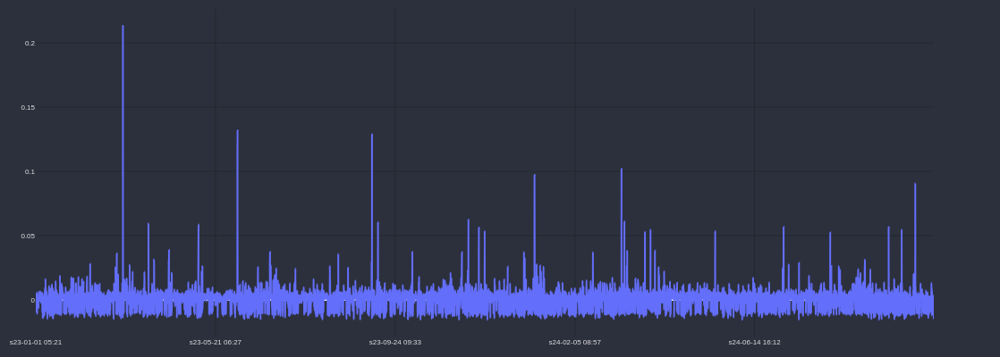

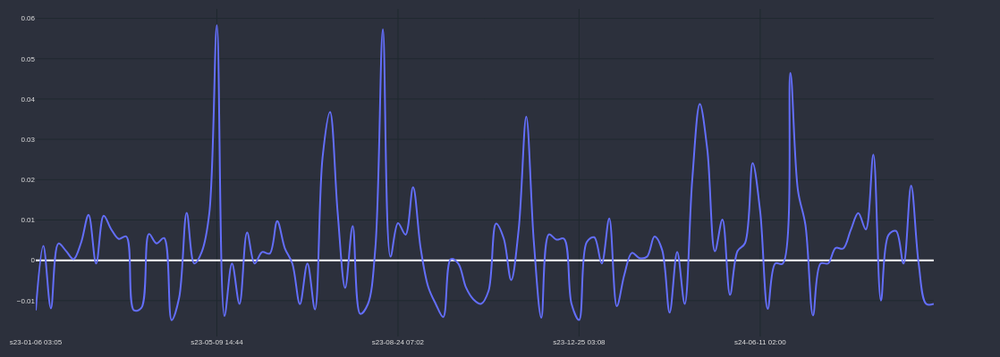

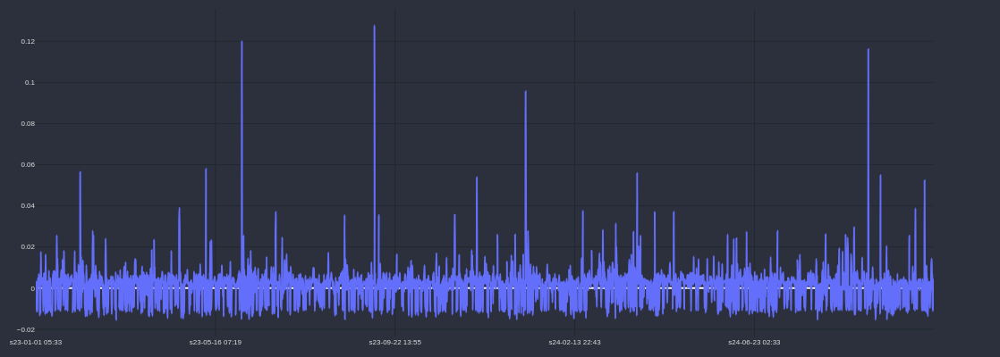

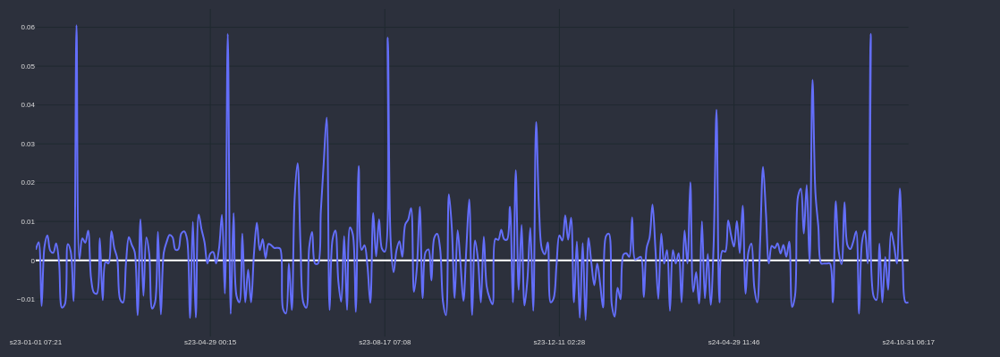

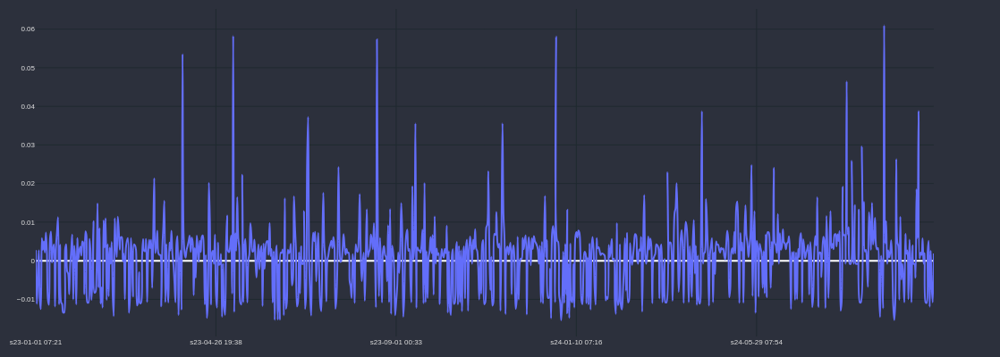

In [26]:
for index in range(len(rank_dict['VIDTUSDT'])):
    rank = rank_dict['VIDTUSDT'].iloc[index]
    rank.r['time'] = rank.r['end_time']
    rank.r['GAIN_I'] = rank.r.strategy_pair1

    cp = CandlePlot(rank.r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

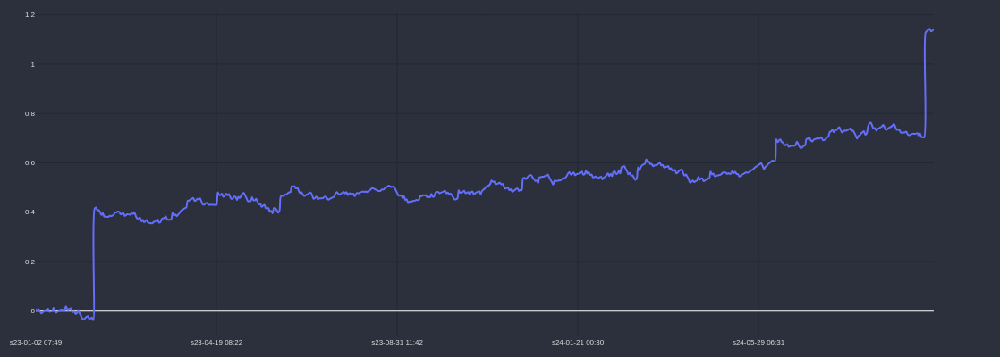

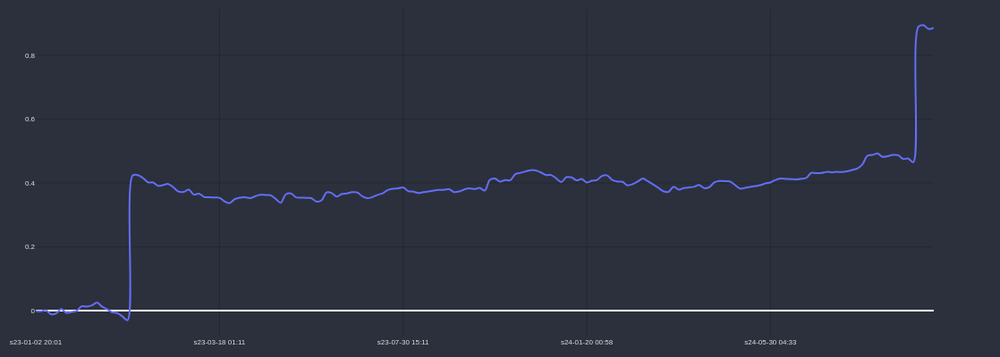

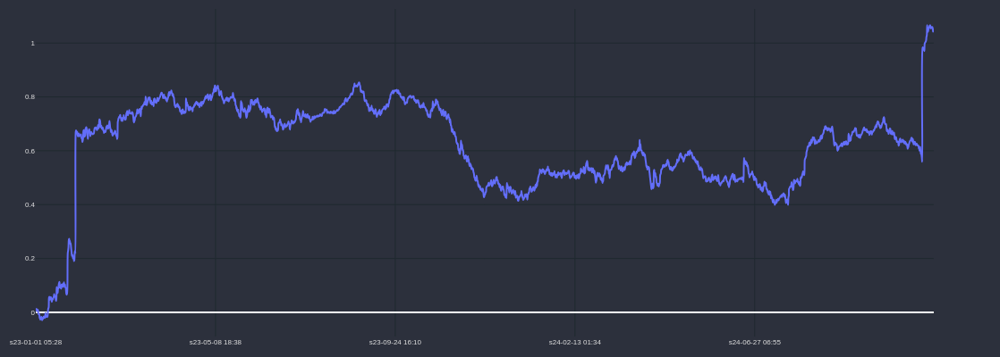

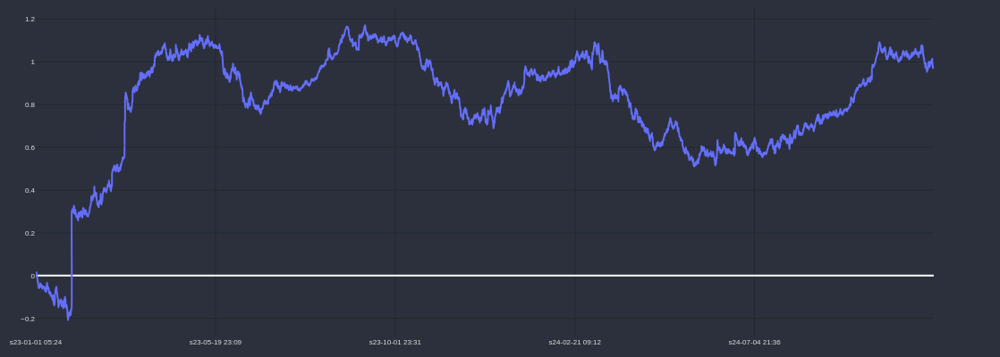

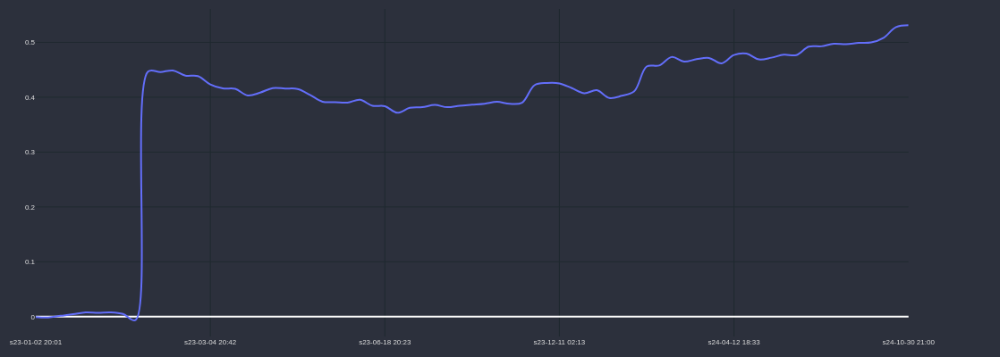

In [98]:
for index in range(len(rank_dict['ALPHAUSDT'])):
    rank = rank_dict['ALPHAUSDT'].iloc[index]
    rank.r['time'] = rank.r['end_time']
    rank.r['GAIN_I'] = rank.r.strategy_pair1.cumsum()

    cp = CandlePlot(rank.r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

In [99]:
def calcular_operacoes_simultaneas(df):
    # Ordena o DataFrame por start_time para facilitar o cálculo
    df = df.sort_values(by='start_time').reset_index(drop=True)
    # Inicializa a coluna operacoes_simultaneas com o valor mínimo de 0
    df['operacoes_simultaneas'] = 0
    
    # Itera sobre cada operação e conta quantas estão abertas e não fechadas no momento
    for i, row in df.iterrows():
        # Conta quantas operações estão em andamento no tempo de start_time da operação atual
        count = ((df['start_time'] <= row['start_time']) & (df['end_time'] > row['start_time'])).sum()
        # Atualiza a coluna com o número de operações simultâneas, garantindo o mínimo de 1
        df.at[i, 'operacoes_simultaneas'] = max(count, 1)
        
    return df

In [103]:

# Concatenar os DataFrames filtrados, acessando os 10 primeiros elementos do atributo `r` de cada um
concat_ranks = pd.concat(
    [
        rank_dict['ALPHAUSDT'].iloc[index].r for index in range(len(rank_dict['ALPHAUSDT']))
    ]
)


In [104]:
concat_ranks.shape

(9919, 21)

In [105]:
concat_ranks.strategy_pair1.sum()

np.float64(4.576423559925067)

In [106]:
df_test = calcular_operacoes_simultaneas(concat_ranks)
df_test.operacoes_simultaneas.max()

np.int64(11)

In [107]:
df_test.tail()

,running,start_index_m5,count,trigger_type,strategy_pair1,strategy_no_tc,total_opened,first_return,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
9914,False,963915,12,0,0.006975,0.001450,1,False,1,0.01125,0.007775,sell,0.0690,0.0689,0,1,0.0001,2024-10-31 14:06:00,2024-10-31 13:55:00,2024-10-31 14:06:00,1.142840,3
9915,False,964280,43,0,-0.002274,-0.001474,1,False,0,0.00500,-0.010000,sell,0.0678,0.0679,0,1,-0.0001,2024-10-31 20:42:00,2024-10-31 20:00:00,2024-10-31 20:42:00,0.978096,1
9916,False,964332,28,0,-0.005202,-0.004402,1,False,0,0.00500,-0.010000,sell,0.0680,0.0683,0,1,-0.0003,2024-10-31 21:19:00,2024-10-31 20:52:00,2024-10-31 21:19:00,0.972894,1
9917,False,964335,25,0,-0.003733,-0.002933,1,False,0,0.00500,-0.010000,sell,0.0681,0.0683,0,1,-0.0002,2024-10-31 21:19:00,2024-10-31 20:55:00,2024-10-31 21:19:00,1.046493,2
9918,False,964373,68,0,-0.002267,-0.001467,1,False,0,0.00500,-0.010000,buy,0.0682,0.0681,1,0,-0.0001,2024-10-31 22:40:00,2024-10-31 21:33:00,2024-10-31 22:40:00,0.970627,1


In [108]:
concat_ranks.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy_pair1',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'trailing_stop_target', 'trailing_stop_loss', 'type', 'start_price',
       'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN', 'result', 'end_time',
       'start_time', 'time', 'GAIN_I'],
      dtype='object')

In [109]:
df_test.strategy_pair1.sum()

np.float64(4.576423559925068)

In [110]:
(5000/df_test.operacoes_simultaneas.max()) * df_test.strategy_pair1.sum()

np.float64(2080.1925272386675)

In [111]:
df_test.tail()

,running,start_index_m5,count,trigger_type,strategy_pair1,strategy_no_tc,total_opened,first_return,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
9914,False,963915,12,0,0.006975,0.001450,1,False,1,0.01125,0.007775,sell,0.0690,0.0689,0,1,0.0001,2024-10-31 14:06:00,2024-10-31 13:55:00,2024-10-31 14:06:00,1.142840,3
9915,False,964280,43,0,-0.002274,-0.001474,1,False,0,0.00500,-0.010000,sell,0.0678,0.0679,0,1,-0.0001,2024-10-31 20:42:00,2024-10-31 20:00:00,2024-10-31 20:42:00,0.978096,1
9916,False,964332,28,0,-0.005202,-0.004402,1,False,0,0.00500,-0.010000,sell,0.0680,0.0683,0,1,-0.0003,2024-10-31 21:19:00,2024-10-31 20:52:00,2024-10-31 21:19:00,0.972894,1
9917,False,964335,25,0,-0.003733,-0.002933,1,False,0,0.00500,-0.010000,sell,0.0681,0.0683,0,1,-0.0002,2024-10-31 21:19:00,2024-10-31 20:55:00,2024-10-31 21:19:00,1.046493,2
9918,False,964373,68,0,-0.002267,-0.001467,1,False,0,0.00500,-0.010000,buy,0.0682,0.0681,1,0,-0.0001,2024-10-31 22:40:00,2024-10-31 21:33:00,2024-10-31 22:40:00,0.970627,1


In [112]:
df_test.describe()

,start_index_m5,count,trigger_type,strategy_pair1,strategy_no_tc,total_opened,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
count,9919.000000,9919.000000,9919.0,9919.000000,9919.000000,9919.000000,9919.000000,9919.000000,9919.000000,9919.000000,9919.000000,9919.000000,9919.000000,9919.000000,9919,9919,9919,9919.000000,9919.000000
mean,486452.125013,63.869241,0.0,0.000461,0.001129,1.071983,0.436233,0.010327,-0.002502,0.100191,0.100230,0.504486,0.495514,0.000107,2023-12-05 01:04:56.691198464,2023-12-05 00:02:04.052827904,2023-12-05 01:04:56.691198464,0.724906,1.630507
min,53.000000,1.000000,0.0,-0.015796,-0.062933,1.000000,0.000000,0.005000,-0.010000,0.042900,0.042900,0.000000,0.000000,-0.008100,2023-01-01 05:24:00,2023-01-01 04:13:00,2023-01-01 05:24:00,-0.207902,1.000000
25%,242803.500000,13.000000,0.0,-0.003599,-0.002913,1.000000,0.000000,0.005000,-0.010000,0.077000,0.076900,0.000000,0.000000,-0.000300,2023-06-18 20:23:00,2023-06-18 19:23:30,2023-06-18 20:23:00,0.564669,1.000000
50%,482323.000000,29.000000,0.0,0.001624,0.002328,1.000000,0.000000,0.005000,-0.010000,0.101400,0.101400,1.000000,0.000000,0.000200,2023-12-02 03:53:00,2023-12-02 03:23:00,2023-12-02 03:53:00,0.746661,1.000000
75%,734570.500000,60.000000,0.0,0.003538,0.004288,1.000000,1.000000,0.010000,0.003988,0.117000,0.117100,1.000000,1.000000,0.000400,2024-05-25 10:36:00,2024-05-25 07:30:30,2024-05-25 10:36:00,0.934972,2.000000
max,964373.000000,26262.000000,0.0,0.453021,0.453821,4.000000,1.000000,1.280000,0.432103,0.207200,0.206100,1.000000,1.000000,0.048300,2024-10-31 22:40:00,2024-10-31 21:33:00,2024-10-31 22:40:00,1.170570,11.000000
std,282841.236234,597.847913,0.0,0.014743,0.014833,0.267671,0.495942,0.038078,0.015380,0.029746,0.029749,0.500005,0.500005,0.001491,NaN,NaN,NaN,0.268249,1.157352


In [113]:
df_test = df_test.sort_values(by='end_time', ascending=True).reset_index(drop=True)
df_test.head()

,running,start_index_m5,count,trigger_type,strategy_pair1,strategy_no_tc,total_opened,first_return,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
0,False,53,72,0,0.003784,0.004584,1,False,1,0.01125,0.005101,sell,0.0656,0.0653,0,1,0.0003,2023-01-01 05:24:00,2023-01-01 04:13:00,2023-01-01 05:24:00,0.003784,1
1,False,57,72,0,0.005307,0.006107,1,False,1,0.01125,0.005093,sell,0.0657,0.0653,0,1,0.0004,2023-01-01 05:28:00,2023-01-01 04:17:00,2023-01-01 05:28:00,0.005307,2
2,False,158,24,0,0.002296,0.003096,1,False,1,0.01000,0.004122,buy,0.0645,0.0647,1,0,0.0002,2023-01-01 06:21:00,2023-01-01 05:58:00,2023-01-01 06:21:00,0.006080,1
3,False,676,35,0,0.003855,0.004655,1,False,0,0.00500,-0.010000,sell,0.0646,0.0643,0,1,0.0003,2023-01-01 15:10:00,2023-01-01 14:36:00,2023-01-01 15:10:00,0.009934,1
4,False,731,32,0,-0.002349,-0.001549,1,False,0,0.00500,-0.010000,sell,0.0645,0.0646,0,1,-0.0001,2023-01-01 16:02:00,2023-01-01 15:31:00,2023-01-01 16:02:00,0.007585,1


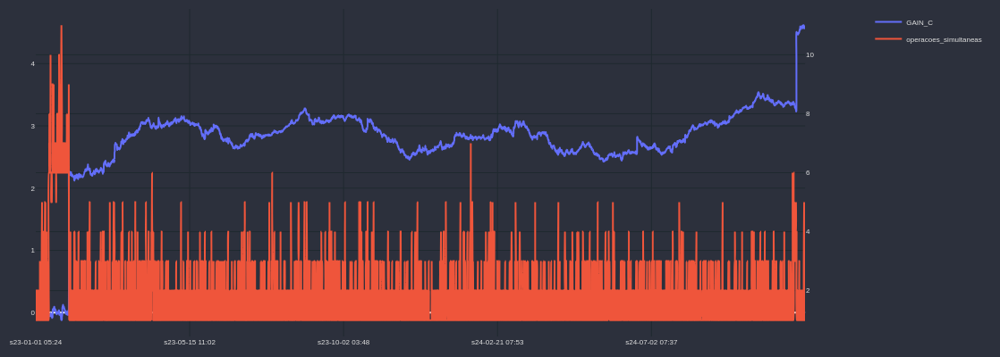

In [114]:

df_test['time'] = df_test['end_time']
df_test['GAIN_C'] = df_test.strategy_pair1.cumsum()

cp = CandlePlot(df_test, candles=False)
cp.show_plot(line_traces = ['GAIN_C'], sec_traces=['operacoes_simultaneas'])

In [115]:
pos = df_test[df_test['strategy_pair1']>0]
neg = df_test[df_test['strategy_pair1']<0]

print(len(pos),len(neg), len(pos)/(len(pos)+len(neg)))

6141 3778 0.6191148301240045


In [116]:
df_test.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy_pair1',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'trailing_stop_target', 'trailing_stop_loss', 'type', 'start_price',
       'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN', 'result', 'end_time',
       'start_time', 'time', 'GAIN_I', 'operacoes_simultaneas', 'GAIN_C'],
      dtype='object')

In [117]:
import numpy as np
import pandas as pd

def calcular_retorno_dinamico_com_alavancagem(df, saldo_total, alavancagem=1, percentual_capital=10):
    """
    Calcula o retorno acumulado em dólar com controle de reserva, considerando operações simultâneas e mantendo
    o saldo total inalterado até que as operações sejam fechadas. Adiciona incremento de 2% ao capital usado.

    Parâmetros:
        df (pd.DataFrame): DataFrame contendo as colunas `start_time`, `end_time`, e `strategy`.
        saldo_total (float): Saldo total inicial disponível para operações.
        alavancagem (float): Fator de alavancagem a ser aplicado nas operações.
        percentual_capital (float): Percentual do saldo total a ser usado em cada operação.

    Retorno:
        pd.DataFrame: DataFrame atualizado com colunas adicionais e métricas.
    """
    # Ordenar o DataFrame pelo tempo de abertura
    df = df.sort_values(by="start_time").reset_index(drop=True)

    # Inicializar arrays e variáveis
    n = len(df)
    capital_usado = saldo_total / percentual_capital
    incremento_percentual = 0.0

    status = np.full(n, "fechada", dtype=object)
    retorno_dolar = np.zeros(n)
    capital_acumulado = np.full(n, saldo_total)
    saldo_total_arr = np.full(n, saldo_total)
    capital_usado_arr = np.zeros(n)

    for i in range(n):
        # Fechar operações cujo end_time já passou
        abertas = (status == "aberta") & (df["end_time"].values <= df["start_time"].iloc[i])
        for j in np.where(abertas)[0]:
            retorno_alavancado = alavancagem * (df["strategy_pair1"].iloc[j] * capital_usado_arr[j])
            saldo_total += retorno_alavancado  # Atualizar saldo total com o retorno da operação
            retorno_dolar[j] = retorno_alavancado
            status[j] = "fechada"
            # Recalcular o capital usado após fechar uma operação
            capital_usado = saldo_total / percentual_capital

        # Incrementar o capital usado em 2% para a nova operação
        capital_usado *= (1 + incremento_percentual)
        capital_usado_arr[i] = capital_usado

        # Marcar a operação como aberta
        status[i] = "aberta"

        # Atualizar o saldo acumulado e saldo total
        saldo_total_arr[i] = saldo_total
        capital_acumulado[i] = saldo_total

    # Adicionar os resultados ao DataFrame
    df["capital_usado"] = capital_usado_arr
    df["retorno_dolar"] = retorno_dolar
    df["capital_acumulado"] = capital_acumulado
    df["saldo_total"] = saldo_total_arr
    df["status"] = status

    print("Resumo Final:")
    print(f"Saldo total final: ${saldo_total:.2f}")
    return df


In [118]:
df_test.operacoes_simultaneas.mean()

np.float64(1.6305071075713278)

In [120]:
# valor_inicial = 5.0
saldo_total = 1000.0

# Exemplo de uso com alavancagem
df_resultado_dinamico_alavancagem = calcular_retorno_dinamico_com_alavancagem(
    df_test, saldo_total, alavancagem=10, percentual_capital=5
)

Resumo Final:
Saldo total final: $29810.25


In [121]:
df_test.strategy_pair1.sum()

np.float64(4.576423559925068)

In [122]:
df_resultado_dinamico_alavancagem[["start_time", "end_time", "strategy_pair1", "capital_usado", "retorno_dolar",
              "capital_acumulado", "saldo_total"]].head(2500)

,start_time,end_time,strategy_pair1,capital_usado,retorno_dolar,capital_acumulado,saldo_total
0,2023-01-01 04:13:00,2023-01-01 05:24:00,0.003784,200.000000,7.567319,1000.000000,1000.000000
1,2023-01-01 04:17:00,2023-01-01 05:28:00,0.005307,200.000000,10.613778,1000.000000,1000.000000
2,2023-01-01 05:58:00,2023-01-01 06:21:00,0.002296,203.636220,4.675442,1018.181098,1018.181098
3,2023-01-01 14:36:00,2023-01-01 15:10:00,0.003855,204.571308,7.885773,1022.856540,1022.856540
4,2023-01-01 15:31:00,2023-01-01 16:02:00,-0.002349,206.148463,-4.842813,1030.742313,1030.742313
5,2023-01-01 15:45:00,2023-01-01 16:02:00,0.003833,206.148463,7.902110,1030.742313,1030.742313
6,2023-01-01 16:54:00,2023-01-01 17:11:00,0.002291,206.760322,4.737277,1033.801610,1033.801610
7,2023-01-01 18:04:00,2023-01-01 18:21:00,0.002291,207.707777,4.758985,1038.538887,1038.538887
8,2023-01-01 19:19:00,2023-01-01 20:44:00,0.003812,208.659574,7.953780,1043.297872,1043.297872
9,2023-01-01 21:56:00,2023-01-01 22:21:00,0.003826,210.250330,8.044321,1051.251652,1051.251652


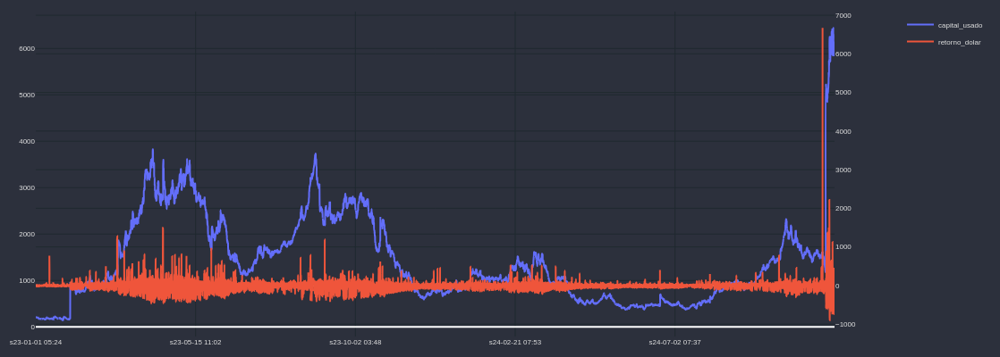

In [123]:
cp = CandlePlot(df_resultado_dinamico_alavancagem, candles=False)
cp.show_plot(line_traces = ['capital_usado'], sec_traces=['retorno_dolar'])

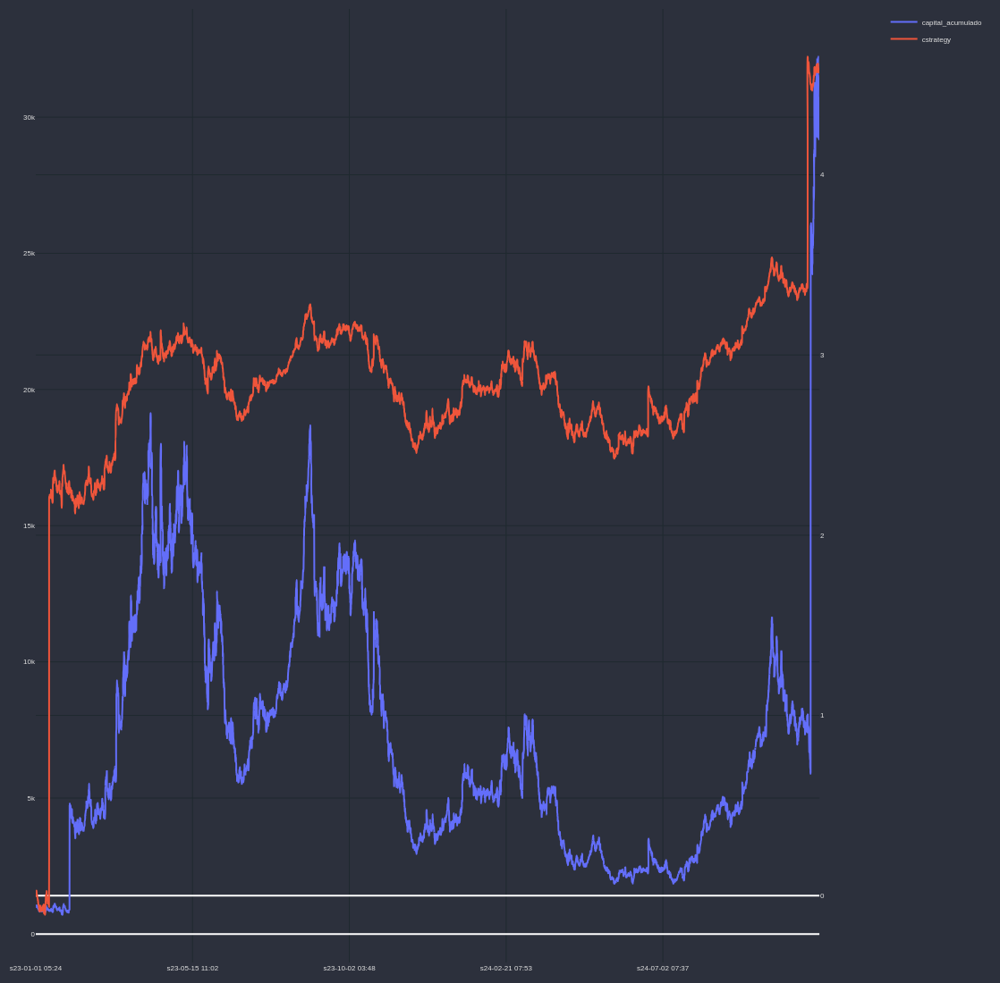

In [124]:
df_resultado_dinamico_alavancagem['cstrategy'] = df_resultado_dinamico_alavancagem.strategy_pair1.cumsum()
cp = CandlePlot(df_resultado_dinamico_alavancagem, candles=False)
cp.show_plot(line_traces = ['capital_acumulado'], sec_traces=['cstrategy'], height=1100)